
# Preprocessing - Integration scPoli, merge with MultiVI and others and Benchmark


## Setup


In [2]:
# General
import scipy as sci
import numpy as np
import pandas as pd
import logging
import time
import pickle
from itertools import chain
import session_info
import gc

# Plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import rcParams
from matplotlib.pyplot import rc_context
from matplotlib import cm
import seaborn as sb

# Analysis
import muon as mu
from muon import atac as ac # Import a module with ATAC-seq-related functions
import scanpy as sc
import scanpy.external as sce
import torch
#import scipy.stats as sci
from sklearn.metrics import mean_squared_error

from sklearn.metrics import classification_report
from scarches.models.scpoli import scPoli

 captum (see https://github.com/pytorch/captum).


In [3]:
# Settings

import warnings
warnings.filterwarnings("ignore")

## Directory
base_dir = '/mnt/hdd/'
data_dir = 'data/Healthy/'
nb_dir = 'Notebooks/Gut_project/'
sc.settings.figdir = base_dir + nb_dir + 'Figures'
sc.settings.cachedir = base_dir + 'Cache'

## Scanpy settings
sc.settings.verbosity = 3
sc.logging.print_versions()
session_info.show()

-----
anndata     0.10.7
scanpy      1.10.1
-----
PIL                         10.2.0
absl                        NA
anyio                       NA
array_api_compat            1.7.1
arrow                       1.3.0
asciitree                   NA
asttokens                   NA
attr                        23.2.0
attrs                       23.2.0
babel                       2.15.0
certifi                     2024.06.02
cffi                        1.16.0
charset_normalizer          3.3.2
chex                        0.1.86
comm                        0.2.2
contextlib2                 NA
cupy                        NA
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.9.0.post0
debugpy                     1.8.1
decorator                   5.1.1
defusedxml                  0.7.1
docrep                      0.3.2
etils                       1.7.0
exceptiongroup              1.2.1
executing                   2.0.1
fastjsonschema              NA
flax

In [4]:
%run utils.ipynb

In [5]:
mymap = load_RdOrYl_cmap_settings()

## Setup R

In [6]:
#R
import rpy2
import rpy2.robjects as ro
import rpy2.rinterface_lib.callbacks
from rpy2.robjects import pandas2ri
import anndata2ri
setup_R('/home/scanalysis/mnt/envs/scUV/lib/R')

In [7]:
%%R

.libPaths()

[1] "/home/scanalysis/mnt/envs/scUV/lib/R/library"


In [8]:
%%R
# Parallelization
library(BiocParallel)
register(MulticoreParam(20, progressbar = TRUE))

library(future)
plan("multicore", workers = 20)
options(future.globals.maxSize = 64 * 1024^2)
plan()

library(doParallel)
registerDoParallel(20)

sessionInfo()

R version 4.3.1 (2023-06-16)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 22.04.4 LTS

Matrix products: default
BLAS/LAPACK: /home/scanalysis/mnt/envs/scUV/lib/libopenblasp-r0.3.27.so;  LAPACK version 3.12.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=de_DE.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=de_DE.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=de_DE.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=de_DE.UTF-8 LC_IDENTIFICATION=C       

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] parallel  tools     stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
[1] doParallel_1.0.17   iterators_1.0.14    foreach_1.5.2      
[4] future_1.33.2       BiocParallel_1.36.0

loaded via a namespace (and not attached):
[1] compiler_4.3.1    parallelly_1.37.1 listenv_0.9.1

Loading required package: foreach
Loading required package: iterators
Loading required package: parallel
In addition: Warning message:
package ‘future’ was built under R version 4.3.3 


## Load Data

In [9]:
adata_michi = mu.read_h5mu('/mnt/hdd/data/scMultiome_Mouse_Crypts_FVF_mdata_markedDoublets_mergedPeaks_normalized_initialAnno_rmDoublets_integrated_imputed_annotatedRefined_sync.h5mu')

In [10]:
adata_michi_gex = adata_michi.mod['rna']

In [11]:
adata_michi_gex

AnnData object with n_obs × n_vars = 30374 × 18678
    obs: 'sample', 'name', 'experiment', 'int_id', 'seq_id_gex_id', 'seq_id_atac', 'reporter', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'final_doublets', 'final_doublets_cat', 'doublet_calls', 'size_factors', 'leiden', 'S_score', 'G2M_score', 'phase', 'proliferation', 'leiden_wnn', 'initial_cell_type', 'sample_density', 'dca_split', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_5', 'leiden_6', 'leiden_7', 'leiden_8', 'leiden_9', 'cl_cell_type_fine_eec', 'ISC_score', 'dpt_pseudotime', 'dpt_pseudotime_g2m', 'dpt_pseudotime_g1', 'palantir_pseudotime_g1', 'palantir_pseudotime_g2m', 'palantir_pseudotime', 'sctour_pseudotime', 'ct_score', 'ct_pseudotime', 'ct_num_exp_genes', 'latent_time', 'pseudotime', 'macrostates_fwd', 'init_states_fwd', 'init_states_fwd_probs', 'term_states_fwd', 'term_states_fwd_probs', 'clusters_gradients', 'fp_EEC_Ghrl', 'fp_EEC_Glp1_Cck', 'fp_EEC_

In [12]:
del adata_michi
gc.collect()

2210

In [13]:
adata = sc.read_h5ad('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_woimmune.h5ad')

In [14]:
adata

AnnData object with n_obs × n_vars = 119399 × 20924
    obs: 'sample', 'log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'leiden', 'is_paneth', 'doublet_score', 'predicted_doublet', 'scrublet_doublets_cat', 'hybrid_class', 'hybrid_score', 'hybrid_class_sct', 'hybrid_score_sct', 'scds_doublets', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.class.sct', 'scDblFinder.score.sct', 'sdf_doublets', 'pANN', 'DF_classifications_1', 'DF_classifications_2', 'pANN.sct', 'DF_classifications_1.sct', 'DF_classifications_2.sct', 'df_doublets', 'dd_doublets', 'dd_scores', 'dd_log_p_values', 'dd_voting_average', 'dd_-log_p_values', 'dd_doublets_cat', '_scvi_batch', '_scvi_labels', 'solo_doublet_score', 'solo_singlet_score', 'solo_doublet_class', 'solo_doublets', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'doublets_shown', 'atac_sdf_doublets', 'Droplet', 'cell_ranger', 'cell', 'cell_confirmed', 'total_counts_rank

In [15]:
FVF_samples = ['598_FVF_Crypts_Rep1','599_FVF_Crypts_Rep2','FVF-high','FVF-low']
exclude = ['FVF_neg']

#### correct indices adata

In [89]:
indices_dict={'FVF-high':0,
 'FVF-low':1,
 '597_NVF_Crypts_Rep1':2,
 '598_FVF_Crypts_Rep1':3,
 '599_FVF_Crypts_Rep2':4,
 '604_NVF_Crypts_Rep2':5,
 'CD_1':6,
 'Control_3_FVR':7,
 'Control_4_FVR':8,
 'MUC13637':9,
 'CD_3':10,
 'Control_2':11,
 'CD_mtmg':12,
 'Control_7_FVR':13,
 'Control_1':14,
 'MUC13636':15,
 'CD_2':16,
 'Control_5_FVR':17,
 'Control_6':18,
 'MUC8399':19}

In [17]:
indices_dict2={'FVF_high':0,
 'FVF_low':1,
 'FVF_Rep1':3,
 'FVF_Rep2':4,}

In [90]:
# Function to generate new index based on conditions
def generate_new_index(index, sample, indices_dict):
    suffix = indices_dict[sample]
    if index.endswith('-1-1'):
        new_index = index[:-4]
    elif index.endswith('-1-2'):
        new_index = index[:-4]  
    elif index.endswith('-1-3'):
        new_index = index[:-4]  
    else:
        new_index = index[:-2] # Remove the last '-1'
    return f"{new_index}-1_{suffix}"

In [19]:
# Apply the function to generate new indices
new_indices = [generate_new_index(idx, row['sample'], indices_dict) for idx, row in adata.obs.iterrows()]

# Set the new indices to the DataFrame
adata.obs.index = new_indices

In [20]:
adata.obs['sample']

AAACAGCCACCTGTAA-1_2     597_NVF_Crypts_Rep1
AAACAGCCAGTCTAGC-1_2     597_NVF_Crypts_Rep1
AAACAGCCATAATGAG-1_2     597_NVF_Crypts_Rep1
AAACATGCAAACCTAT-1_2     597_NVF_Crypts_Rep1
AAACATGCACCTCACC-1_2     597_NVF_Crypts_Rep1
                                ...         
TTTGTCATCATCGCTC-1_19                MUC8399
TTTGTCATCATCGGAT-1_19                MUC8399
TTTGTCATCATGCATG-1_19                MUC8399
TTTGTCATCGACGGAA-1_19                MUC8399
TTTGTCATCGGTGTTA-1_19                MUC8399
Name: sample, Length: 119399, dtype: category
Categories (20, object): ['597_NVF_Crypts_Rep1', '598_FVF_Crypts_Rep1', '599_FVF_Crypts_Rep2', '604_NVF_Crypts_Rep2', ..., 'FVF-low', 'MUC8399', 'MUC13636', 'MUC13637']

In [21]:
adata_michi_gex = adata_michi_gex[~adata_michi_gex.obs['sample'].isin(exclude)] #to get rid of FVF-neg

In [22]:
# Apply the function to generate new indices
new_indices = [generate_new_index(idx, row['sample'], indices_dict2) for idx, row in adata_michi_gex.obs.iterrows()]

# Set the new indices to the DataFrame
adata_michi_gex.obs.index = new_indices

In [23]:
adata_michi_gex.obs['sample'][adata_michi_gex.obs['sample']=='FVF_high']

AAACAGCCACTTCATC-1_0    FVF_high
AAACAGCCAGTTTGTG-1_0    FVF_high
AAACAGCCATGTCAGC-1_0    FVF_high
AAACAGCCATTGTGGC-1_0    FVF_high
AAACATGCACACAATT-1_0    FVF_high
                          ...   
TTTGTGGCAGTTATCG-1_0    FVF_high
TTTGTGTTCCCATAGG-1_0    FVF_high
TTTGTGTTCCTCACAC-1_0    FVF_high
TTTGTGTTCCTCAGTC-1_0    FVF_high
TTTGTTGGTGCGCGTA-1_0    FVF_high
Name: sample, Length: 6364, dtype: category
Categories (4, object): ['FVF_Rep1', 'FVF_Rep2', 'FVF_high', 'FVF_low']

In [24]:

adata.obs['cell_type_michi']= adata_michi_gex.obs['cell_type_fine']

In [ ]:
adata.obs['study']= 'reference'

In [ ]:
# get cells without annotation of michi and set obs 'study' to 'query'
adata.obs.loc[adata.obs['cell_type_michi'].isna(), 'study'] = 'query'

In [ ]:
adata.obs['cell_type_michi']= adata.obs['initial_cell_type']
adata.obs['cell_type_michi']= adata_michi_gex.obs['cell_type_fine']

In [25]:
adata_FVF = adata[adata.obs['sample'].isin(FVF_samples)]
adata_FVF

View of AnnData object with n_obs × n_vars = 28875 × 20924
    obs: 'sample', 'log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'leiden', 'is_paneth', 'doublet_score', 'predicted_doublet', 'scrublet_doublets_cat', 'hybrid_class', 'hybrid_score', 'hybrid_class_sct', 'hybrid_score_sct', 'scds_doublets', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.class.sct', 'scDblFinder.score.sct', 'sdf_doublets', 'pANN', 'DF_classifications_1', 'DF_classifications_2', 'pANN.sct', 'DF_classifications_1.sct', 'DF_classifications_2.sct', 'df_doublets', 'dd_doublets', 'dd_scores', 'dd_log_p_values', 'dd_voting_average', 'dd_-log_p_values', 'dd_doublets_cat', '_scvi_batch', '_scvi_labels', 'solo_doublet_score', 'solo_singlet_score', 'solo_doublet_class', 'solo_doublets', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'doublets_shown', 'atac_sdf_doublets', 'Droplet', 'cell_ranger', 'cell', 'cell_confirmed', 'total_coun

In [26]:
adata_FVF.obs['cell_type_michi']

AAACAGCCAAGCCACT-1_3        EEC prog. (early)
AAACAGCCACGAATCC-1_3                   Goblet
AAACAGCCAGCAACCT-1_3                      NaN
AAACAGCCAGGGAGGA-1_3                      NaN
AAACATGCAAGCTTAT-1_3                      NaN
                                ...          
TTTGTGGCACTAAGAA-1_1    Enterocyte prog. (TA)
TTTGTGTTCCCATAAA-1_1    Enterocyte prog. (TA)
TTTGTGTTCTCAATAG-1_1    Enterocyte prog. (TA)
TTTGTGTTCTTTGAGA-1_1                     Tuft
TTTGTTGGTGCAATGC-1_1                      NaN
Name: cell_type_michi, Length: 28875, dtype: category
Categories (14, object): ['ISC', 'EEC prog. (early)', 'EEC prog. (mid)', 'EEC prog. (late)', ..., 'Tuft prog. (late)', 'Tuft', 'Enterocyte prog. (TA)', 'Enterocyte']

In [27]:
del adata_FVF
del adata_michi_gex
gc.collect()

540

In [28]:
adata.write('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_woimmune_michi_annotation_added.h5ad')

#### load metadata

In [9]:
adata =sc.read_h5ad('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_woimmune_michi_annotation_added.h5ad')

In [10]:
## add metadata
metadata_df =read_excel_metadata(f'/mnt/hdd/data/metadata_mouse_gut.xlsx')
# Ensure folder name is the index in metadata for easier access
metadata_df.drop(metadata_df[metadata_df['kit'] == 'Multiome_ATAC_v1'].index, inplace=True)
metadata_df.drop(metadata_df[~metadata_df['condition'].isin(['Ctr','Ctr/WT'])].index, inplace=True)
metadata_df.set_index('folder name', inplace=True)
metadata_df.drop(['Sample Pooling - confounded with Project?','date','Project Name','Link_id','sample name','Cell Count [cells/µl]','Viable Cells [%]','Lib. Concentration [ng/µl]','Lib. Molarity [nM]','Average Lib. Size [bp]','cDNA Cycles','Lib. Cycles','10x Sample Index','Sequencing Depth [reads/cell]','MUC ID','exclusion, reason'], axis=1, inplace=True)

In [11]:
metadata_df

,Project,sequencing,modality (confounded with 'sequencing',condition,sample number Minas,Internal ID,SeqID,kit,line,strain,enriched,enrichment proportion,treatment,diet,tissue,structure,target cell number,Read Length,Index Type,sequencing machine
folder name,,,,,,,,,,,,,,,,,,,,
CD_1,A5,single cell,GEX,Ctr,34,27,NaN,v2,B6N?,FVF+/+,FVF,50% FVF : 50% live,none,CD,SI,Crypts,8000.0,NaN,Single Index (T),HiSeq4000
CD_2,A5,single cell,GEX,Ctr,33,29,NaN,v2,B6N?,FVF+/+,FVF,50% FVF : 50% live,none,CD,SI,Crypts,8000.0,NaN,Single Index (T),HiSeq4000
CD_3,A5,single cell,GEX,Ctr,32,31,NaN,v2,B6N?,FVF+/+,FVF,50% FVF : 50% live,none,CD,SI,Crypts,8000.0,NaN,Single Index (T),HiSeq4000
CD_mtmg,A6,single cell,GEX,Ctr,9,33,NaN,v2,B6N?,FltpiCre/mTmG,Fltp?,?,none,CD,SI,Crypts,3100.0,NaN,Single Index (T),HiSeq4000
Control_1,A9,single cell,GEX,Ctr/WT,35?,44,NaN,v2,B6N?,WT,No,None,none,Chow,SI,Crypts,8000.0,NaN,Single Index (T),HiSeq4000
Control_2,A9,single cell,GEX,Ctr/WT,36?,46,NaN,v2,B6N?,WT,No,None,none,Chow,SI,Crypts,8000.0,NaN,Single Index (T),HiSeq4000
Control_3_FVR,A9,single cell,GEX,Ctr,37?,48,NaN,v2,B6N?,FVR+/-,FVR,10% FVR+ : 90% live,none,Chow,SI,Crypts,8000.0,NaN,Single Index (T),HiSeq4000
Control_4_FVR,A9,single cell,GEX,Ctr,38?,50,NaN,v2,B6N?,FVR+/-,FVR,10% FVR+ : 90% live,none,Chow,SI,Crypts,8000.0,NaN,Single Index (T),HiSeq4000
Control_5_FVR,A14,single cell,GEX,Ctr,39?,68,NaN,v2,B6N?,FVR+/-,FVR,50% FVR+ : 50% live,none,Chow,SI,Crypts,8000.0,NaN,Single Index (T),HiSeq4000


In [12]:
# Function to update adata.obs with metadata using a lambda function
for col in metadata_df.columns:
    try:
        adata.obs[col] = adata.obs['sample'].apply(lambda x: metadata_df.at[x, col])
    except KeyError as err:
        print(f'no such key: {err} in col {col}')

In [15]:
del metadata_df
gc.collect()

1770

## visualize UMAP sn vs sc

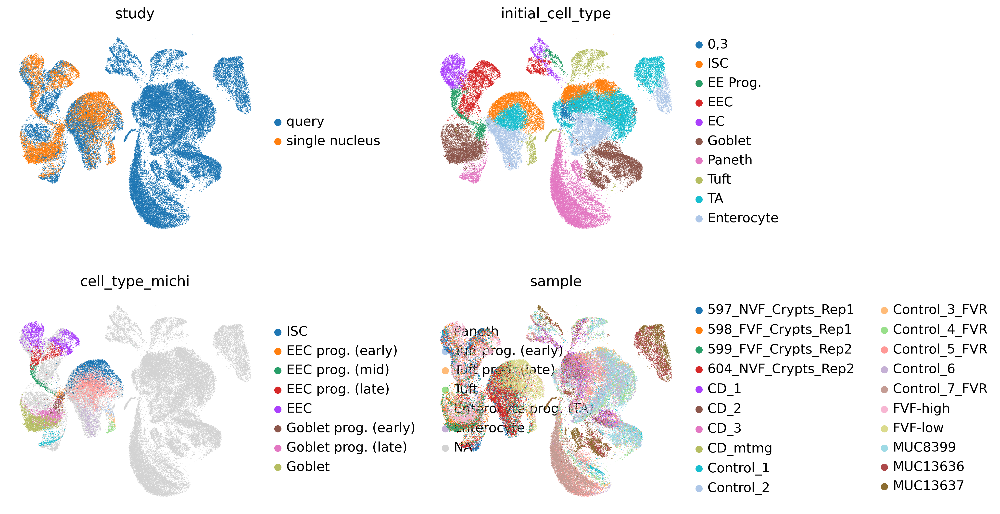

In [35]:
sc.pl.umap(adata, color=['study',  'initial_cell_type', 'cell_type_michi','sample'],ncols =2, wspace=0.5, frameon=False)

In [16]:
# Clean up .obs
adata.obs = adata.obs.loc[:,['sample','log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'is_paneth', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'phase', 'proliferation', 'initial_cell_type', 'cell_type_michi', 'study']].copy()
# delete all uns/obsm/varm/layers/obsp/raw
del adata.uns
del adata.obsm
del adata.varm
del adata.obsp
del adata.raw
gc.collect()

0

In [17]:
adata.write('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_woimmune_michi_annotation_added_meta.h5ad')

#### reload metadata

In [9]:
adata =sc.read_h5ad('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_woimmune_michi_annotation_added_meta.h5ad')

In [10]:
adata

AnnData object with n_obs × n_vars = 119399 × 20924
    obs: 'sample', 'log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'is_paneth', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'phase', 'proliferation', 'initial_cell_type', 'cell_type_michi', 'study'
    var: 'genome-0', 'genome-1', 'genome-2', 'genome-3', 'genome-4', 'genome-5', 'genome-6', 'genome-7', 'genome-8', 'genome-9', 'genome-10', 'genome-11', 'genome-12', 'genome-13', 'genome-14', 'genome-15', 'genome-16', 'genome-17', 'genome-18', 'genome-19', 'is_ambient', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_variance', 'sct.variable'
    layers: 'ambiguous', 'log_raw_counts', 'matrix', 'raw_counts', 'scran_counts', 'sct_counts', 'sct_logcounts', 'sct_scale_data', 'spliced', 'unspliced'

#### reduce adata size

In [11]:
adata.X = adata.layers['raw_counts']
adata.var['genome'] = adata.var['genome-0'].copy()

In [12]:
# Remove all unneccessary var data
adata.var = adata.var.loc[:,['genome', 'highly_variable','is_ambient']].copy()

In [13]:
del adata.layers
gc.collect()

442

## scPoli

### initialize scPoli

In [14]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

condition_key = 'study'
cell_type_key = 'cell_type_michi'
reference = [
    'single nucleus'
]
query = ['query']

In [15]:
adata.obs['query'] = adata.obs[condition_key].isin(query)
adata.obs['query'] = adata.obs['query'].astype('category')
source_adata = adata[adata.obs.study.isin(reference)].copy()
target_adata = adata[adata.obs.study.isin(query)].copy()

In [16]:
source_adata, target_adata

(AnnData object with n_obs × n_vars = 22433 × 20924
     obs: 'sample', 'log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'is_paneth', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'phase', 'proliferation', 'initial_cell_type', 'cell_type_michi', 'study', 'query'
     var: 'genome', 'highly_variable', 'is_ambient',
 AnnData object with n_obs × n_vars = 96966 × 20924
     obs: 'sample', 'log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'is_paneth', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'phase', 'proliferation', 'initial_cell_type', 'cell_type_michi', 'study', 'query'
     var: 'genome', 'highly_variable', 'is_ambient')

In [17]:
#save source_adata, target_adata

source_adata.write('source_adata.h5ad')
target_adata.write('target_adata.h5ad')

Model: - condition_keys: obs column names of the covariate(s) you want to use for integration, if a list of names is passed, the model will use independent embeddings for each covariate - cell_type_keys: obs column names of the cell type annotation(s) to use for prototype learning, if a list is passed, the model will compute the prototype loss in parallel for each set of annotations passed - embedding_dims: embedding dimensionality, if an integer is passed, the model will use embeddings of the same dimensionality for each covariate, if the user wishes to define different dimensionalities for each covariate, a list needs to be provided

Training: - pretraining_epochs: number of epochs for which the model is trained in an unsupervised fashion - n_epochs: total number of training epochs, finetuning epochs therefore will be (n_epochs - pretraining_epochs) - eta: weight of the prototype loss - prototype_training: flag that can be used to turn off prototype training - unlabeled_prototype_training: flag that can be used to skip unlabeled prototype computation. This step involves Louvain clustering and can be time-consuming on big datasets. Unlabeled prototypes can be useful for downstream analyses but are not used at training time.

In [18]:
scpoli_model = scPoli(
    adata=source_adata,
    condition_keys=condition_key,
    cell_type_keys=cell_type_key,
    embedding_dims=5,
    recon_loss='nb',
)
scpoli_model.train(
    n_epochs=50,
    pretraining_epochs=40,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=5,
)

Embedding dictionary:
 	Num conditions: [1]
 	Embedding dim: [5]
Encoder Architecture:
	Input Layer in, out and cond: 20924 145 5
	Mean/Var Layer in/out: 145 10
Decoder Architecture:
	First Layer in, out and cond:  10 145 5
	Output Layer in/out:  145 20924 



INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


Initializing dataloaders
Starting training
 |████████████████████| 100.0%  - val_loss: 8336.79 - val_cvae_loss: 8318.41 - val_prototype_loss:   18.38 - val_labeled_loss:    3.68


In [19]:
del adata
gc.collect()

0

### train scPoli

We recommend using a pretraining/training epoch ratio of approximately 80 or 90%. If you train for more total epochs you should use a higher ratio, whereas if you’re training for only a few epochs, this ratio can be smaller. If the model is trained withthe prototype loss for too many epochs it can lead to very concentrated clusters in latent space.

In [20]:
scpoli_query = scPoli.load_query_data(
    adata=target_adata,
    reference_model=scpoli_model,
    labeled_indices=[],
)

Embedding dictionary:
 	Num conditions: [2]
 	Embedding dim: [5]
Encoder Architecture:
	Input Layer in, out and cond: 20924 145 5
	Mean/Var Layer in/out: 145 10
Decoder Architecture:
	First Layer in, out and cond:  10 145 5
	Output Layer in/out:  145 20924 



In [21]:
scpoli_query.train(
    n_epochs=50,
    pretraining_epochs=40,
    eta=10
)

INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


The missing labels are: {nan}
Therefore integer value of those labels is set to -1
The missing labels are: {nan}
Therefore integer value of those labels is set to -1
The missing labels are: {nan}
Therefore integer value of those labels is set to -1
The missing labels are: {nan}
Therefore integer value of those labels is set to -1
Initializing dataloaders
Starting training
 |████████████████----| 80.0%  - val_loss: 10912.05 - val_cvae_loss: 10912.05
Initializing unlabeled prototypes with Leiden with an unknown number of  clusters.
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:39)
running Leiden clustering
    finished: found 47 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:05:10)
Clustering succesful. Found 47 clusters.
 |████████████████████| 100.0%  - val_loss: 10915.42 - val_cv

### results

The uncertainties returned by the model consist of the distance between the cell in the latent space and the labeled prototypes closest to it. This distance does not have an upper bound, and the scale of the distance can provide information on the heterogeneity of the dataset. We also offer the option to scale the uncertainties between 0 and 1.

In [22]:
torch.cuda.empty_cache()

In [23]:
torch.cuda.memory_allocated()

144397312

In [18]:
del source_adata
del target_adata
gc.collect()

127

In [24]:
torch.cuda.empty_cache()

In [25]:
torch.cuda.memory_allocated()

144397312

In [26]:
import pickle

In [27]:
# Open a file in write mode
with open('scpoli_query.pickle', 'wb') as file:
    # Serialize and save the object to the file
    pickle.dump(scpoli_query, file)

In [28]:
# Open a file in write mode
with open('scpoli_model.pickle', 'wb') as file:
    # Serialize and save the object to the file
    pickle.dump(scpoli_model, file)

In [32]:
del scpoli_model
gc.collect()

5379

In [13]:
# Open the file in read mode
with open('scpoli_query.pickle', 'rb') as file:
    # Deserialize and load the object from the file
    scpoli_query = pickle.load(file)

In [29]:
results_dict = scpoli_query.classify(target_adata, scale_uncertainties=True)

In [56]:
target_adata.obs[cell_type_key] = target_adata.obs['initial_cell_type']

In [57]:
target_adata.obs[cell_type_key].value_counts()

TA            22737
Paneth        21192
Goblet        14882
Enterocyte    14414
ISC            9343
EEC            5330
Tuft           3314
EC             3078
EE Prog.       1511
0,3            1165
Name: cell_type_michi, dtype: int64

In [58]:
for i in range(len(cell_type_key)):
    preds = results_dict[cell_type_key]["preds"]
    results_dict[cell_type_key]["uncert"]
    classification_df = pd.DataFrame(
        classification_report(
            y_true=target_adata.obs[cell_type_key],
            y_pred=preds,
            output_dict=True,
        )
    ).transpose()
print(classification_df)

                       precision    recall  f1-score       support
0,3                     0.000000  0.000000  0.000000   1165.000000
EC                      0.000000  0.000000  0.000000   3078.000000
EE Prog.                0.000000  0.000000  0.000000   1511.000000
EEC                     0.519333  0.420826  0.464919   5330.000000
EEC prog. (early)       0.000000  0.000000  0.000000      0.000000
EEC prog. (late)        0.000000  0.000000  0.000000      0.000000
EEC prog. (mid)         0.000000  0.000000  0.000000      0.000000
Enterocyte              0.888862  0.777369  0.829386  14414.000000
Enterocyte prog. (TA)   0.000000  0.000000  0.000000      0.000000
Goblet                  0.933781  0.345854  0.504756  14882.000000
Goblet prog. (early)    0.000000  0.000000  0.000000      0.000000
Goblet prog. (late)     0.000000  0.000000  0.000000      0.000000
ISC                     0.549044  0.762068  0.638250   9343.000000
Paneth                  0.981921  0.943139  0.962139  21192.00

In [59]:
#get latent representation of reference data
scpoli_query.model.eval()
data_latent_source = scpoli_query.get_latent(
    source_adata,
    mean=True
)

adata_latent_source = sc.AnnData(data_latent_source)
adata_latent_source.obs = source_adata.obs.copy()

#get latent representation of query data
data_latent= scpoli_query.get_latent(
    target_adata,
    mean=True
)

adata_latent = sc.AnnData(data_latent)
adata_latent.obs = target_adata.obs.copy()

#get label annotations
adata_latent.obs['cell_type_pred'] = results_dict[cell_type_key]['preds'].tolist()
adata_latent.obs['cell_type_uncert'] = results_dict[cell_type_key]['uncert'].tolist()
adata_latent.obs['classifier_outcome'] = (
    adata_latent.obs['cell_type_pred'] == adata_latent.obs[cell_type_key]
)

#get prototypes
labeled_prototypes = scpoli_query.get_prototypes_info()
labeled_prototypes.obs['study'] = 'labeled prototype'
unlabeled_prototypes = scpoli_query.get_prototypes_info(prototype_set='unlabeled')
unlabeled_prototypes.obs['study'] = 'unlabeled prototype'

#join adatas
adata_latent_full = adata_latent_source.concatenate(
    [adata_latent, labeled_prototypes, unlabeled_prototypes],
    batch_key='query'
)
adata_latent_full.obs['cell_type_pred'][adata_latent_full.obs['query'].isin(['0'])] = np.nan
sc.pp.neighbors(adata_latent_full, n_neighbors=15)
sc.tl.umap(adata_latent_full)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:36)


In [60]:
#get adata without prototypes
adata_no_prototypes = adata_latent_full[adata_latent_full.obs['query'].isin(['0', '1'])]

<Axes: title={'center': 'cell_type_pred'}, xlabel='UMAP1', ylabel='UMAP2'>

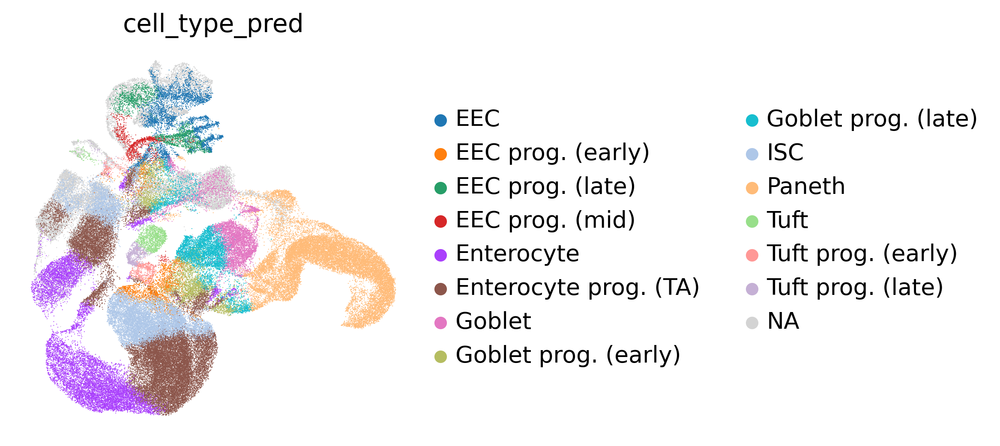

In [61]:
sc.pl.umap(
    adata_no_prototypes,
    color='cell_type_pred',
    show=False,
    frameon=False,
)

<Axes: title={'center': 'study'}, xlabel='UMAP1', ylabel='UMAP2'>

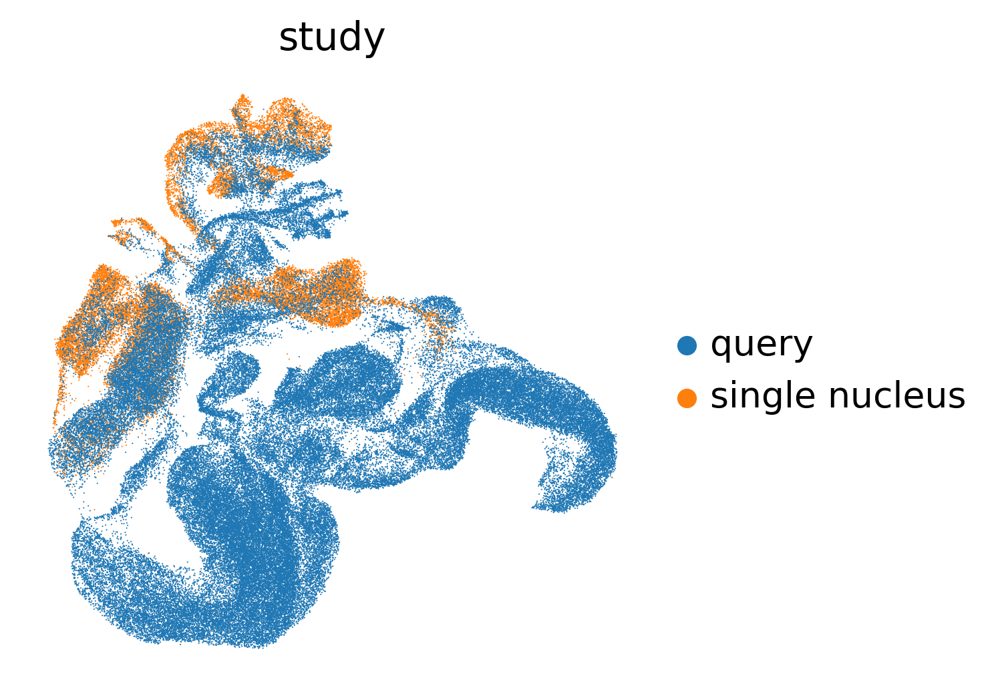

In [62]:
sc.pl.umap(
    adata_no_prototypes,
    color='study',
    show=False,
    frameon=False,
)

#### inspect uncertainity

<Axes: title={'center': 'cell_type_uncert'}, xlabel='UMAP1', ylabel='UMAP2'>

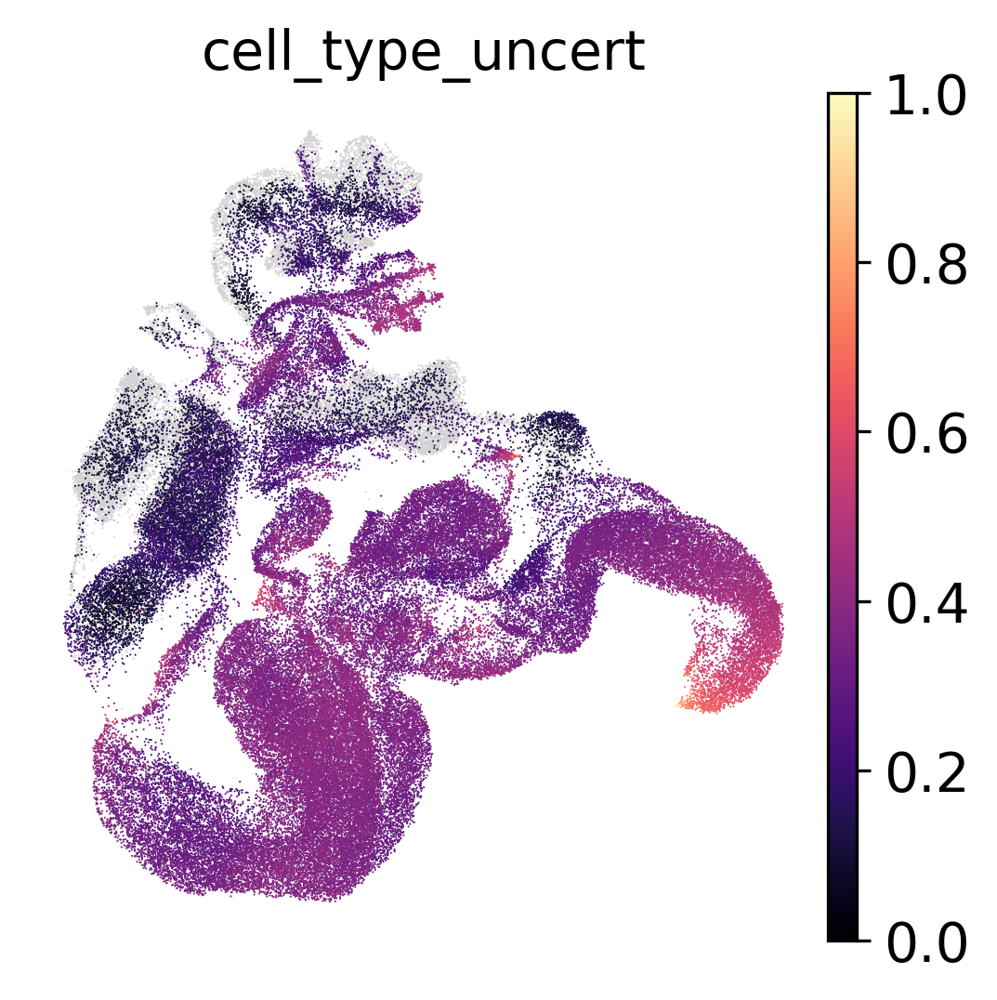

In [63]:
sc.pl.umap(
    adata_no_prototypes,
    color='cell_type_uncert',
    show=False,
    frameon=False,
    cmap='magma',
    vmax=1
)

<Axes: title={'center': 'initial_cell_type'}, xlabel='UMAP1', ylabel='UMAP2'>

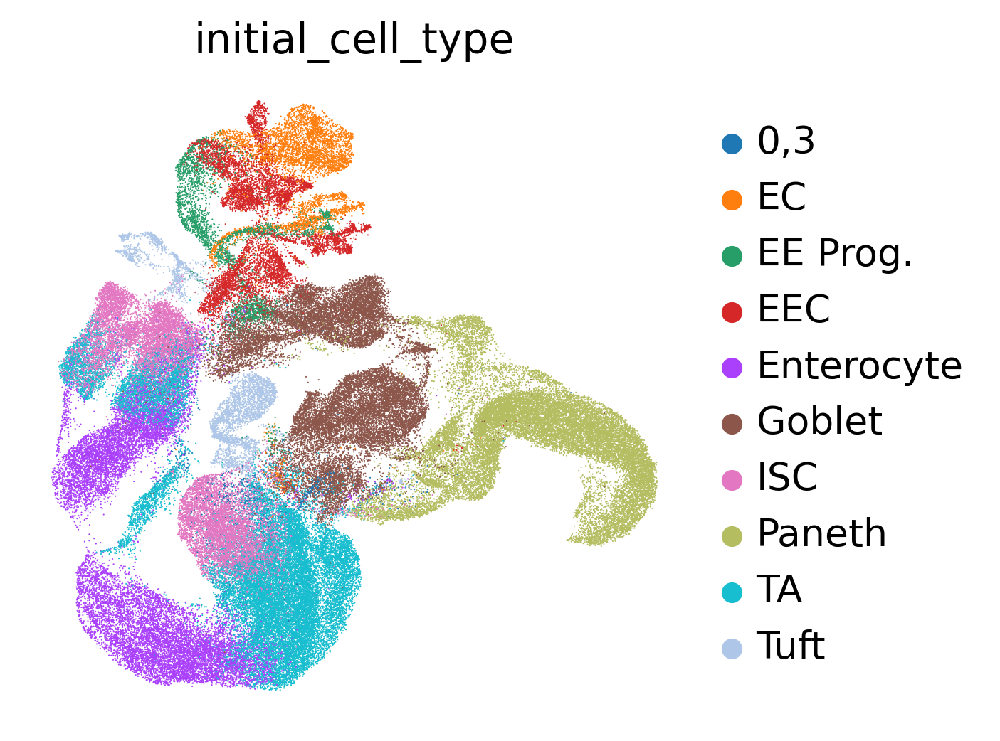

In [72]:
sc.pl.umap(
    adata_no_prototypes,
    color='initial_cell_type',
    show=False,
    frameon=False,
    vmax=1
)

<Axes: title={'center': 'sample'}, xlabel='UMAP1', ylabel='UMAP2'>

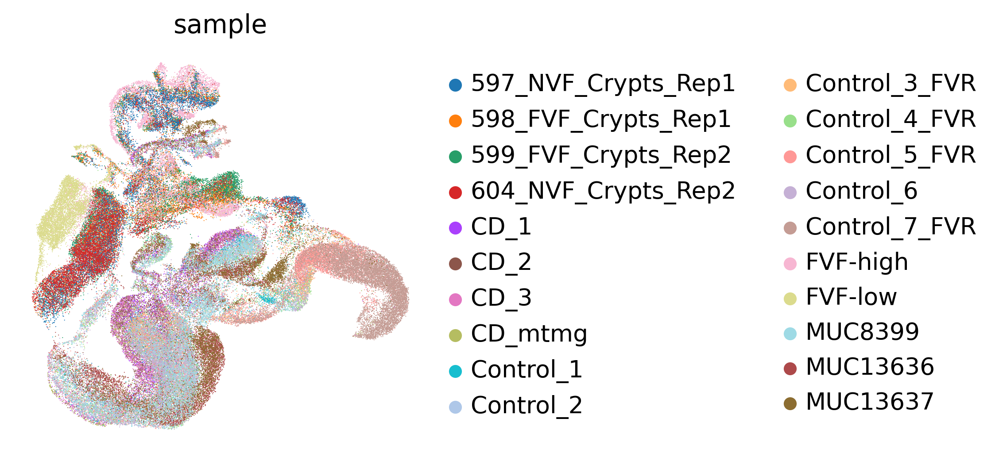

In [73]:
sc.pl.umap(
    adata_no_prototypes,
    color='sample',
    show=False,
    frameon=False,
    vmax=1
)

In [65]:
adata_latent_full

AnnData object with n_obs × n_vars = 119460 × 10
    obs: 'sample', 'log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'is_paneth', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'phase', 'proliferation', 'initial_cell_type', 'cell_type_michi', 'study', 'query', 'conditions_combined', 'cell_type_pred', 'cell_type_uncert', 'classifier_outcome', 'batch', 'cell_type_michi_pred', 'cell_type_michi_uncert'
    uns: 'neighbors', 'umap'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

#### inspect prototypes

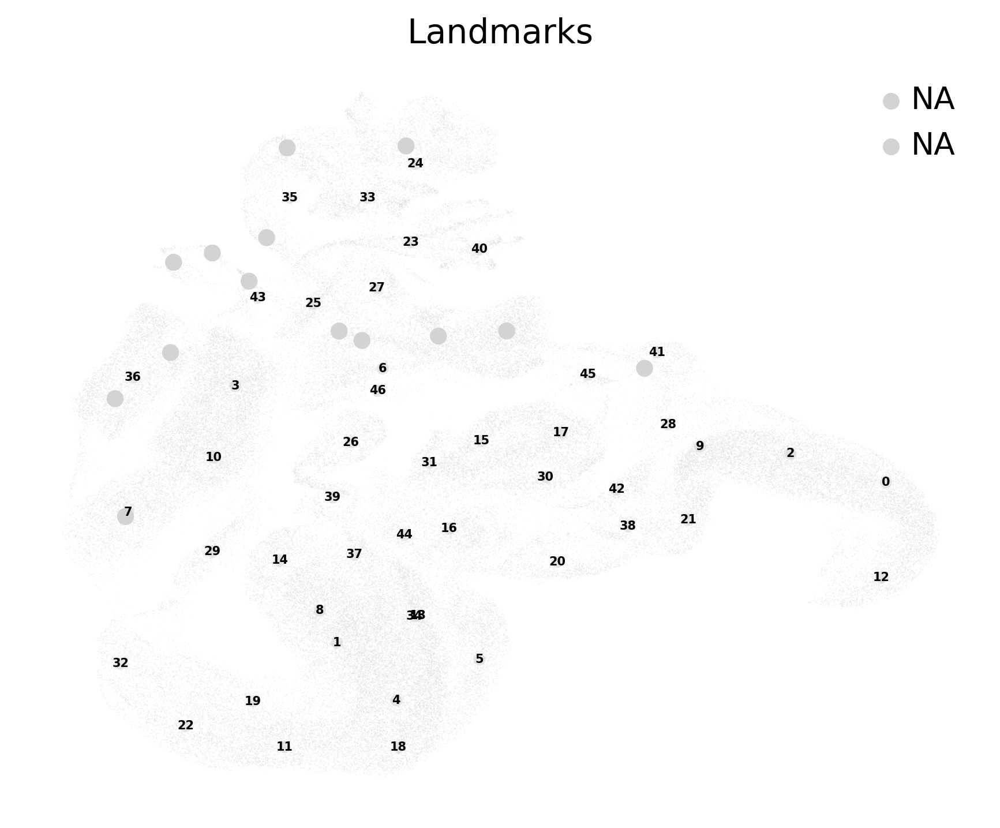

In [66]:
fig, ax = plt.subplots(1, 1, figsize=(6, 5))
adata_labeled_prototypes = adata_latent_full[adata_latent_full.obs['query'].isin(['2'])]
adata_unlabeled_prototypes = adata_latent_full[adata_latent_full.obs['query'].isin(['3'])]
adata_labeled_prototypes.obs['cell_type_michi_pred'] = adata_labeled_prototypes.obs['cell_type_pred'].astype('category')
adata_unlabeled_prototypes.obs['cell_type_michi_pred'] = adata_unlabeled_prototypes.obs['cell_type_pred'].astype('category')
adata_unlabeled_prototypes.obs['cell_type_michi'] = adata_unlabeled_prototypes.obs['cell_type_michi'].astype('category')

sc.pl.umap(
    adata_no_prototypes,
    alpha=0.2,
    show=False,
    ax=ax
)
ax.legend([])
# plot labeled prototypes
sc.pl.umap(
    adata_labeled_prototypes,
    size=200,
    color=f'{cell_type_key}_pred',
    ax=ax,
    show=False,
    frameon=False,
)
cell_types = adata_labeled_prototypes.obs[f'{cell_type_key}_pred'].cat.categories
color_ct = adata_labeled_prototypes.uns[f'{cell_type_key}_pred_colors']
color_dict = dict(zip(cell_types, color_ct))
# plot unlabeled prototypes
sc.pl.umap(
    adata_unlabeled_prototypes,
    size=100,
    color=f'{cell_type_key}_pred',
    #palette=color_dict,
    ax=ax,
    show=False,
    frameon=False,
    alpha=0.5,
)
sc.pl.umap(
    adata_unlabeled_prototypes,
    size=0,
    color=cell_type_key,
    #palette=color_dict,
    frameon=False,
    show=False,
    ax=ax,
    legend_loc='on data',
    legend_fontsize=5,
)
ax.set_title('Landmarks')
h, l = ax.get_legend_handles_labels()
ax.legend().remove()
ax.legend(handles=h[:13], labels= l[:13], frameon=False, bbox_to_anchor=(1, 1))
fig.tight_layout()

After inspecting the prototypes can we observe any unlabeled prototypes falling into the region of high uncertainty? If so --> we can add a new labeled prototype.

# scPoli based on 'https://docs.scarches.org/en/latest/scpoli_ATAC.html' Integration of scATAC data with scPoli

In [9]:
#read adata
adata = sc.read_h5ad('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_rmDoublets_integrated.h5ad')
adata.X = adata.layers['raw_counts'].copy()

In [10]:
adata.X = adata.X.todense()
adata.X = adata.X.astype('float32')

In [11]:
condition_key = ['sample','kit']
cell_type_key = 'initial_cell_type'

In [12]:
scpoli_model = scPoli(
    adata=adata,
    condition_keys=condition_key,
    cell_type_keys=cell_type_key,
    hidden_layer_sizes=[100],
    latent_dim=50,
    embedding_dims=5,
    recon_loss='poisson',
)
scpoli_model.train(
    n_epochs=100, #minas uses 250
    pretraining_epochs=95, #minas uses 100
    use_early_stopping=False,
    alpha_epoch_anneal=1000,
    eta=0.5,
)

Embedding dictionary:
 	Num conditions: [20, 3]
 	Embedding dim: [5, 5]
Encoder Architecture:
	Input Layer in, out and cond: 20855 100 10
	Mean/Var Layer in/out: 100 50
Decoder Architecture:
	First Layer in, out and cond:  50 100 10
	Output Layer in/out:  100 20855 



INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


Initializing dataloaders
Starting training
 |████████████████████| 100.0%  - val_loss: 141396.88 - val_cvae_loss: 141382.45 - val_prototype_loss:   14.43 - val_labeled_loss:   28.86


In [13]:
#get latent representation of reference data
scpoli_model.model.eval()
data_latent = scpoli_model.get_latent(
    adata,
    mean=True
)

adata.obsm["X_scPoli"] = data_latent

In [14]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, use_rep="X_scPoli")
sc.tl.umap(adata, min_dist=0.2)

computing PCA
    with n_comps=50
    finished (0:00:11)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:42)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:17)


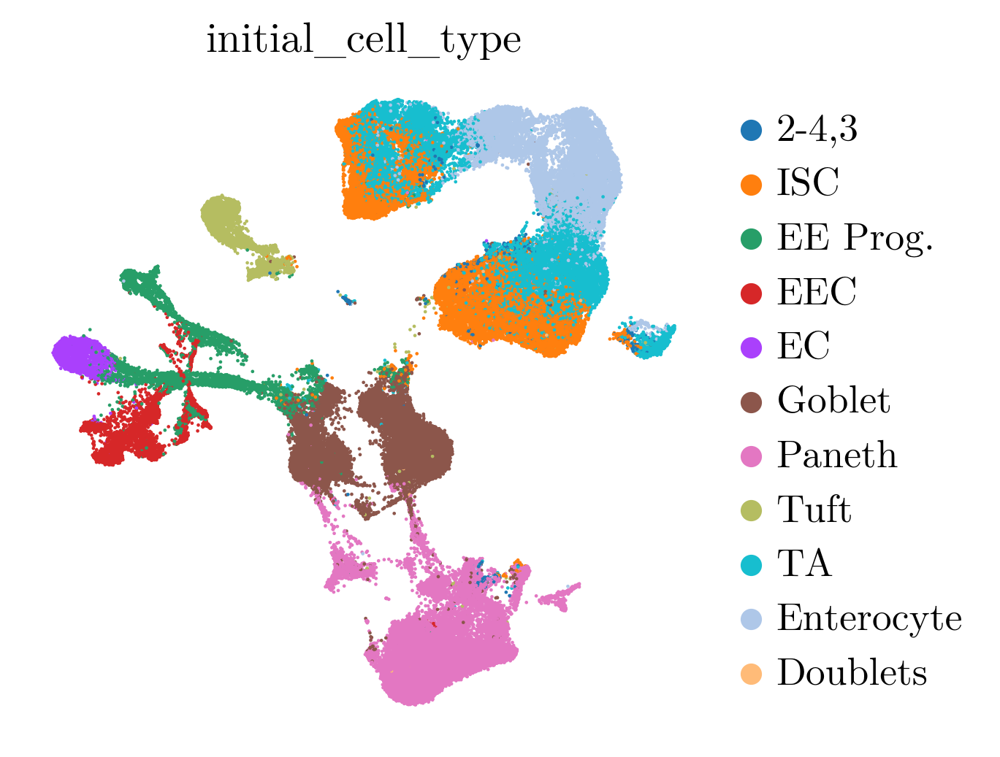

In [15]:
sc.pl.umap(adata, color='initial_cell_type', size = 5)

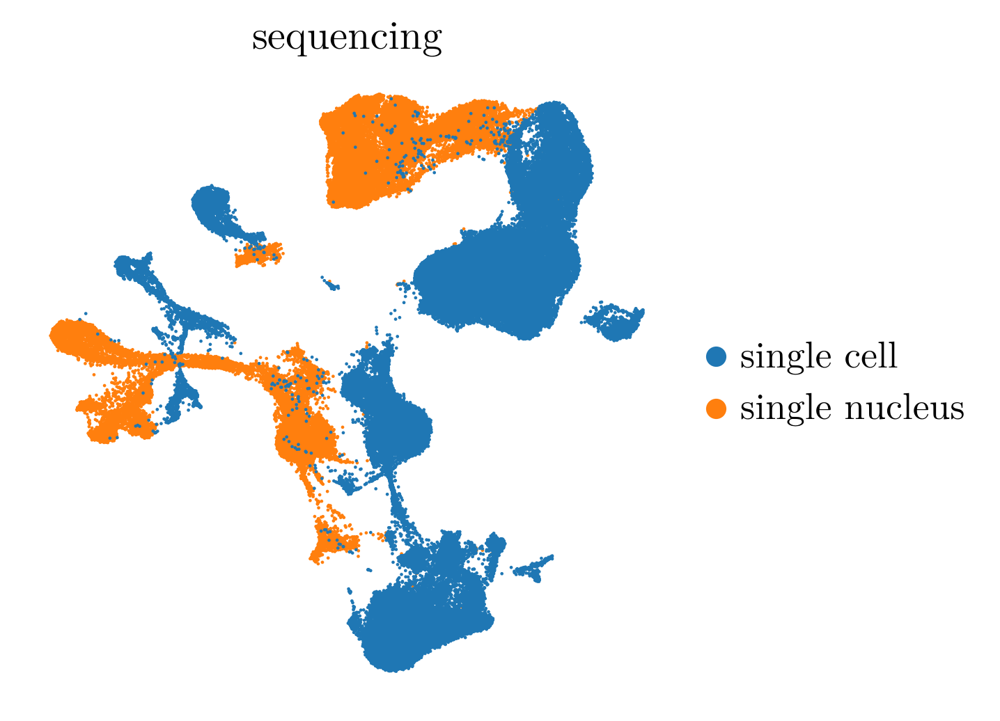

In [16]:
sc.pl.umap(adata, color='sequencing', size = 5)

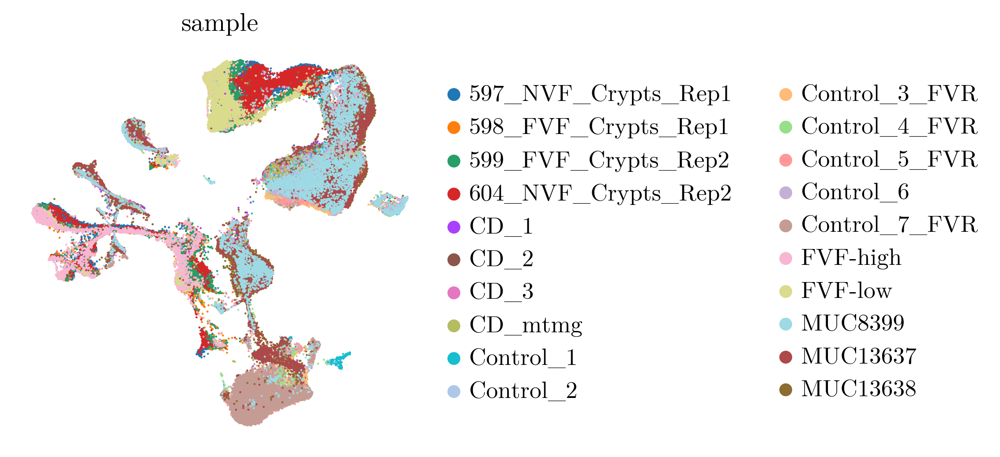

In [17]:
sc.pl.umap(adata, color='sample', size = 5)

#### how it was before adding other metadata:

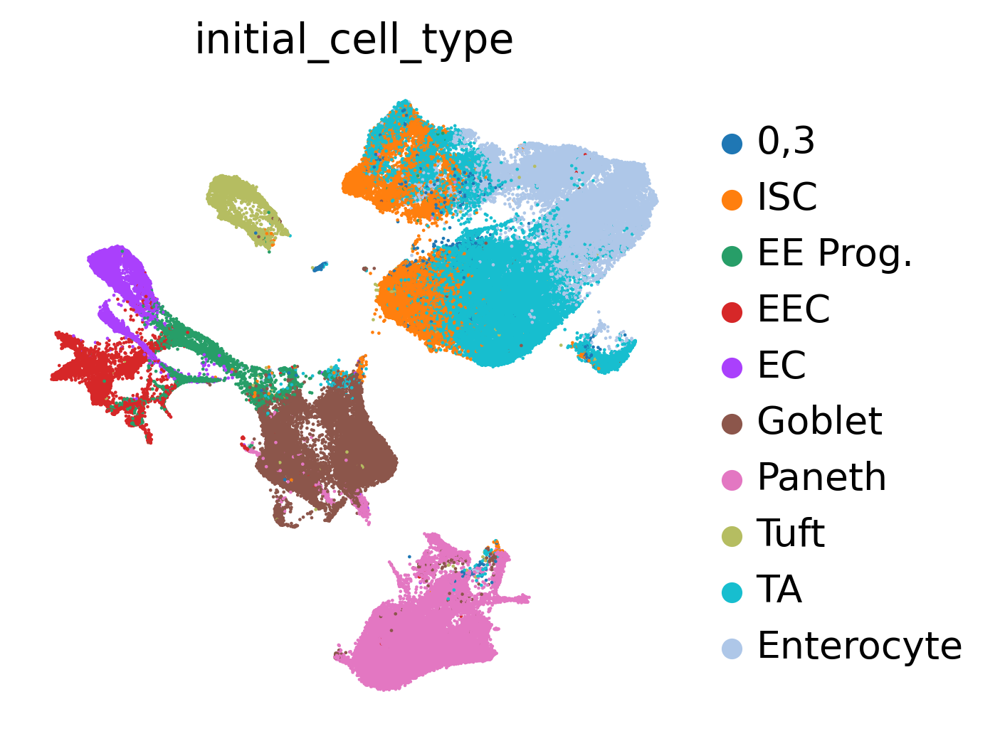

In [20]:
sc.pl.umap(adata, color='initial_cell_type', size = 5)

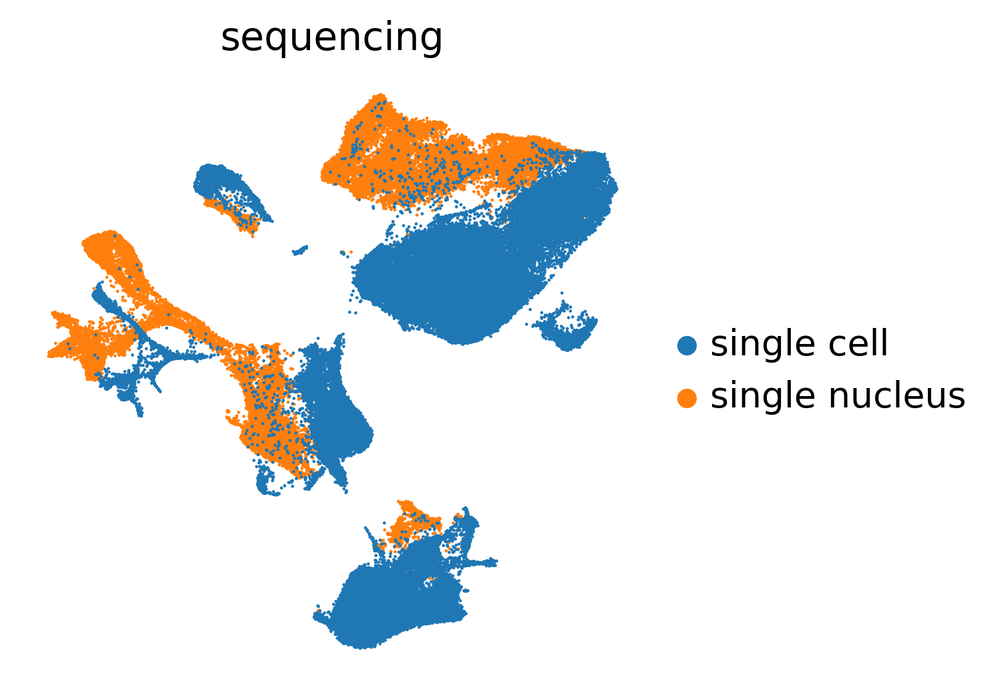

In [21]:
sc.pl.umap(adata, color='sequencing', size = 5)

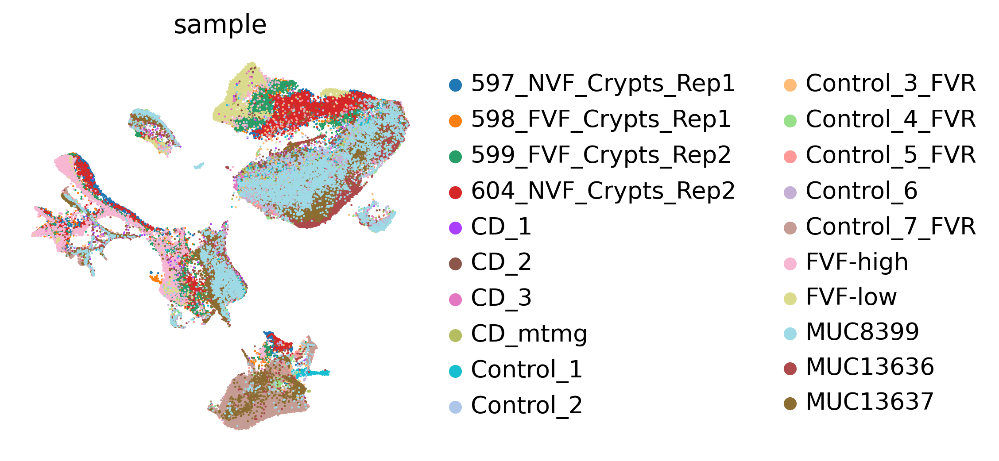

In [22]:
sc.pl.umap(adata, color='sample', size = 5)

## load other integrations

### MuliVI with metadata

In [75]:
adata_multiVI_wo_dblts = sc.read_h5ad('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_noimmune_multivi_orig_wodblts_2_meta.h5ad')
adata_multiVI = sc.read_h5ad('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_noimmune_multivi_orig_wodblts_meta.h5ad')
adata_multiVI.obsm['X_MultiVI_rmDoublets_meta'] = adata_multiVI_wo_dblts.obsm['X_MultiVI_rmDoublets_meta']


In [92]:
adata_multiVI.obs

,sample,log_cell_probs,n_counts,log_counts,n_counts_rank,n_genes,log_genes,mt_frac,rp_frac,ambi_frac,is_paneth,doublet_calls,final_doublets,final_doublets_cat,phase,proliferation,initial_cell_type
AAACAGCCACCTGTAA-1_2,597_NVF_Crypts_Rep1,-9807.520281,2691.348426,7.897798,78244.0,2679,7.893199,0.017763,0.056244,0.464636,Non-Paneth,1,False,False,G1,Non-Cycling,Enterocyte
AAACAGCCATAATGAG-1_2,597_NVF_Crypts_Rep1,-8512.609410,2407.220796,7.786228,86947.0,2534,7.837554,0.019057,0.085725,0.526147,Non-Paneth,0,False,False,S,Cycling,Enterocyte
AAACATGCACCTCACC-1_2,597_NVF_Crypts_Rep1,-8016.353928,2264.799483,7.725242,90649.0,2331,7.754053,0.020171,0.099943,0.563787,Non-Paneth,0,False,False,S,Cycling,ISC
AAACATGCAGATTCAT-1_2,597_NVF_Crypts_Rep1,-11163.764164,3124.242171,8.046947,62152.0,3311,8.105006,0.014427,0.063240,0.440084,Non-Paneth,0,False,False,G2M,Cycling,Enterocyte
AAACATGCAGGCTTGT-1_2,597_NVF_Crypts_Rep1,-10597.905434,2907.159531,7.974932,69427.0,3095,8.037543,0.015349,0.071378,0.499940,Non-Paneth,0,False,False,G2M,Cycling,TA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACATCCAACA-1_19,MUC8399,-7704.691354,2909.287640,7.975664,69343.0,1921,7.560601,0.017850,0.075109,0.532042,Non-Paneth,0,False,False,G1,Non-Cycling,TA
TTTGTCATCATCGCTC-1_19,MUC8399,-7014.578808,2985.415170,8.001494,66635.0,1929,7.564757,0.009250,0.099049,0.565315,Non-Paneth,0,False,False,G1,Non-Cycling,"0,3"
TTTGTCATCATCGGAT-1_19,MUC8399,-17598.782054,4320.551820,8.371138,24865.0,3735,8.225503,0.006190,0.066624,0.553753,Non-Paneth,1,False,False,G2M,Cycling,Goblet
TTTGTCATCATGCATG-1_19,MUC8399,-18697.167734,4416.920396,8.393198,23052.0,3950,8.281471,0.008246,0.070676,0.577018,Non-Paneth,1,False,False,G2M,Cycling,TA


In [91]:
# Apply the function to generate new indices
new_indices = [generate_new_index(idx, row['sample'], indices_dict) for idx, row in adata_multiVI.obs.iterrows()]

# Set the new indices to the DataFrame
adata_multiVI.obs.index = new_indices

In [77]:
del adata_multiVI_wo_dblts
gc.collect()

55815

### others

In [78]:
adata_all = sc.read_h5ad('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_rmDoublets_integrated.h5ad')

In [93]:
# Apply the function to generate new indices
new_indices = [generate_new_index(idx, row['sample'], indices_dict) for idx, row in adata_all.obs.iterrows()]

# Set the new indices to the DataFrame
adata_all.obs.index = new_indices

In [94]:
adata_all.obs

,sample,log_cell_probs,n_counts,log_counts,n_counts_rank,n_genes,log_genes,mt_frac,rp_frac,ambi_frac,...,enriched,enrichment proportion,treatment,diet,tissue,structure,target cell number,Read Length,Index Type,sequencing machine
AAACAGCCACCTGTAA-1_2,597_NVF_Crypts_Rep1,-9807.520281,2691.348426,7.897798,78244.0,2679,7.893199,0.017763,0.056244,0.464636,...,NVF,70% NVF+ : 30% live,none,Chow,SI,Crypts,10000.0,28x10x10x90 (100 cycles),Dual Index (TT),NovaSeq
AAACAGCCATAATGAG-1_2,597_NVF_Crypts_Rep1,-8512.609410,2407.220796,7.786228,86947.0,2534,7.837554,0.019057,0.085725,0.526147,...,NVF,70% NVF+ : 30% live,none,Chow,SI,Crypts,10000.0,28x10x10x90 (100 cycles),Dual Index (TT),NovaSeq
AAACATGCACCTCACC-1_2,597_NVF_Crypts_Rep1,-8016.353928,2264.799483,7.725242,90649.0,2331,7.754053,0.020171,0.099943,0.563787,...,NVF,70% NVF+ : 30% live,none,Chow,SI,Crypts,10000.0,28x10x10x90 (100 cycles),Dual Index (TT),NovaSeq
AAACATGCAGATTCAT-1_2,597_NVF_Crypts_Rep1,-11163.764164,3124.242171,8.046947,62152.0,3311,8.105006,0.014427,0.063240,0.440084,...,NVF,70% NVF+ : 30% live,none,Chow,SI,Crypts,10000.0,28x10x10x90 (100 cycles),Dual Index (TT),NovaSeq
AAACATGCAGGCTTGT-1_2,597_NVF_Crypts_Rep1,-10597.905434,2907.159531,7.974932,69427.0,3095,8.037543,0.015349,0.071378,0.499940,...,NVF,70% NVF+ : 30% live,none,Chow,SI,Crypts,10000.0,28x10x10x90 (100 cycles),Dual Index (TT),NovaSeq
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACATCCAACA-1_19,MUC8399,-7704.691354,2909.287640,7.975664,69343.0,1921,7.560601,0.017850,0.075109,0.532042,...,No,nan,none,Chow,SI,Crypts,NaN,NaN,Single Index (T),HiSeq4000
TTTGTCATCATCGCTC-1_19,MUC8399,-7014.578808,2985.415170,8.001494,66635.0,1929,7.564757,0.009250,0.099049,0.565315,...,No,nan,none,Chow,SI,Crypts,NaN,NaN,Single Index (T),HiSeq4000
TTTGTCATCATCGGAT-1_19,MUC8399,-17598.782054,4320.551820,8.371138,24865.0,3735,8.225503,0.006190,0.066624,0.553753,...,No,nan,none,Chow,SI,Crypts,NaN,NaN,Single Index (T),HiSeq4000
TTTGTCATCATGCATG-1_19,MUC8399,-18697.167734,4416.920396,8.393198,23052.0,3950,8.281471,0.008246,0.070676,0.577018,...,No,nan,none,Chow,SI,Crypts,NaN,NaN,Single Index (T),HiSeq4000


In [102]:
barcodes_wo_dblts = [name for name in adata_multiVI.obs_names]

In [106]:
barcodes_all = [name for name in adata_all.obs_names]

In [96]:
adata_all

AnnData object with n_obs × n_vars = 107269 × 20924
    obs: 'sample', 'log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'leiden', 'is_paneth', 'doublet_score', 'predicted_doublet', 'scrublet_doublets_cat', 'hybrid_class', 'hybrid_score', 'hybrid_class_sct', 'hybrid_score_sct', 'scds_doublets', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.class.sct', 'scDblFinder.score.sct', 'sdf_doublets', 'pANN', 'DF_classifications_1', 'DF_classifications_2', 'pANN.sct', 'DF_classifications_1.sct', 'DF_classifications_2.sct', 'df_doublets', 'dd_doublets', 'dd_scores', 'dd_log_p_values', 'dd_voting_average', 'dd_-log_p_values', 'dd_doublets_cat', '_scvi_batch', '_scvi_labels', 'solo_doublet_score', 'solo_singlet_score', 'solo_doublet_class', 'solo_doublets', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'doublets_shown', 'atac_sdf_doublets', 'Droplet', 'cell_ranger', 'cell', 'cell_confirmed', 'total_counts_rank

In [97]:
adata_multiVI

AnnData object with n_obs × n_vars = 107156 × 20924
    obs: 'sample', 'log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'is_paneth', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'phase', 'proliferation', 'initial_cell_type'
    var: 'genome-0', 'genome-1', 'genome-2', 'genome-3', 'genome-4', 'genome-5', 'genome-6', 'genome-7', 'genome-8', 'genome-9', 'genome-10', 'genome-11', 'genome-12', 'genome-13', 'genome-14', 'genome-15', 'genome-16', 'genome-17', 'genome-18', 'genome-19', 'is_ambient', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_variance', 'sct.variable'
    obsm: 'X_MultiVI_meta', 'X_MultiVI_rmDoublets_meta'
    layers: 'ambiguous', 'log_raw_counts', 'matrix', 'raw_counts', 'scran_counts', 'sct_counts', 'sct_logcounts', 'sct_scale_data', 'spliced', 'unspliced'

In [111]:
barcodes_intersection = list(adata_multiVI.obs_names.intersection(adata_all.obs_names))

In [ ]:
len(barcodes_intersection)

In [112]:
adata_multiVI = adata_multiVI[barcodes_intersection]

In [113]:
adata_all = adata_all[barcodes_intersection]

In [115]:
adata_all.obsm['X_MultiVI_meta'] = adata_multiVI.obsm['X_MultiVI_meta'].copy()
adata_all.obsm['X_MultiVI_rmDoublets_meta'] = adata_multiVI.obsm['X_MultiVI_rmDoublets_meta'].copy()

In [116]:
del adata_multiVI
gc.collect()

3423

In [141]:
adata = adata_all.copy()

In [143]:
adata

AnnData object with n_obs × n_vars = 106803 × 20924
    obs: 'sample', 'log_cell_probs', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'leiden', 'is_paneth', 'doublet_score', 'predicted_doublet', 'scrublet_doublets_cat', 'hybrid_class', 'hybrid_score', 'hybrid_class_sct', 'hybrid_score_sct', 'scds_doublets', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.class.sct', 'scDblFinder.score.sct', 'sdf_doublets', 'pANN', 'DF_classifications_1', 'DF_classifications_2', 'pANN.sct', 'DF_classifications_1.sct', 'DF_classifications_2.sct', 'df_doublets', 'dd_doublets', 'dd_scores', 'dd_log_p_values', 'dd_voting_average', 'dd_-log_p_values', 'dd_doublets_cat', '_scvi_batch', '_scvi_labels', 'solo_doublet_score', 'solo_singlet_score', 'solo_doublet_class', 'solo_doublets', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'doublets_shown', 'atac_sdf_doublets', 'Droplet', 'cell_ranger', 'cell', 'cell_confirmed', 'total_counts_rank

In [142]:
del adata_all
gc.collect()

2485

## Benchmark

In [18]:
from scib_metrics.benchmark import Benchmarker
sc.set_figure_params(scanpy=True, frameon=False, vector_friendly=False ,transparent=True, dpi=150, dpi_save=300)

In [19]:
adata

AnnData object with n_obs × n_vars = 107472 × 20855
    obs: 'sample', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'is_paneth', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'phase', 'proliferation', 'initial_cell_type', 'leiden', 'sample_density', 'Project', 'sequencing', "modality (confounded with 'sequencing'", 'condition', 'Internal ID', 'SeqID', 'kit', 'linienhintergrund', 'strain', 'enriched', 'enrichment proportion', 'treatment', 'diet', 'tissue', 'structure', 'target cell number', 'Read Length', 'Index Type', 'sequencing machine', 'conditions_combined'
    var: 'is_ambient', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_variance', 'sct.variable', 'genome', 'binomial_deviance', 'highly_deviant'
    uns: 'initial_cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'sample_densit

In [20]:
adata.X = adata.layers['raw_counts'].copy()

In [21]:
bm = Benchmarker(
    adata,
    batch_key='sample',
    label_key='initial_cell_type',
    embedding_obsm_keys=['X_MultiVI_rmDoublets_meta','X_MultiVI_meta','X_scPoli','X_scVI', 'X_scANVI', 'X_harmony', 'X_pca'], #'X_scPoli',
    n_jobs=20,
)
bm.benchmark()

computing PCA
    with n_comps=50
    finished (0:01:03)


Embeddings: 100%|██████████| 7/7 [1:53:28<00:00, 972.64s/it]


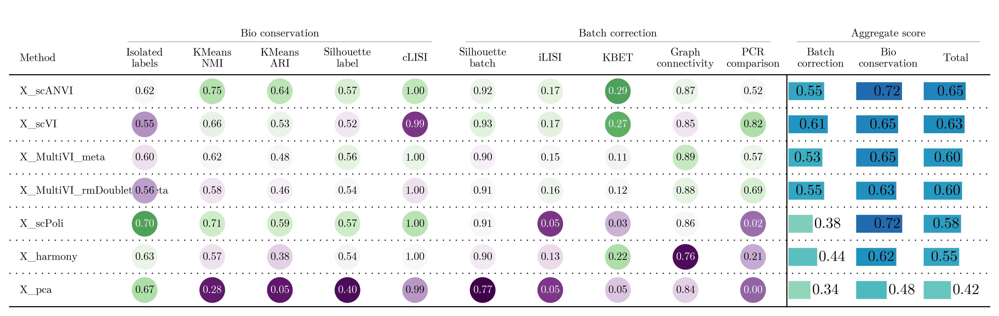

In [22]:
bm.plot_results_table(min_max_scale=False)

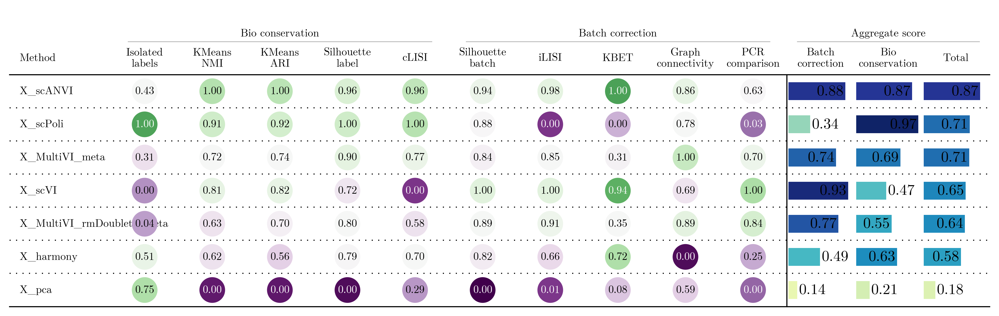

In [23]:
bm.plot_results_table(min_max_scale=True)

#### old variant

In [26]:
adata.X = adata.layers['raw_counts'].copy()

In [27]:
bm = Benchmarker(
    adata,
    batch_key='sample',
    label_key='initial_cell_type',
    embedding_obsm_keys=['X_MultiVI_rmDoublets_meta','X_MultiVI_meta','X_MultiVI_rmDoublets','X_MultiVI','X_scPoli','X_scVI', 'X_scANVI', 'X_harmony', 'X_pca'], #'X_scPoli',
    n_jobs=20,
)
bm.benchmark()

computing PCA
    with n_comps=50
    finished (0:01:07)


Embeddings: 100%|██████████| 9/9 [2:18:39<00:00, 924.34s/it]   


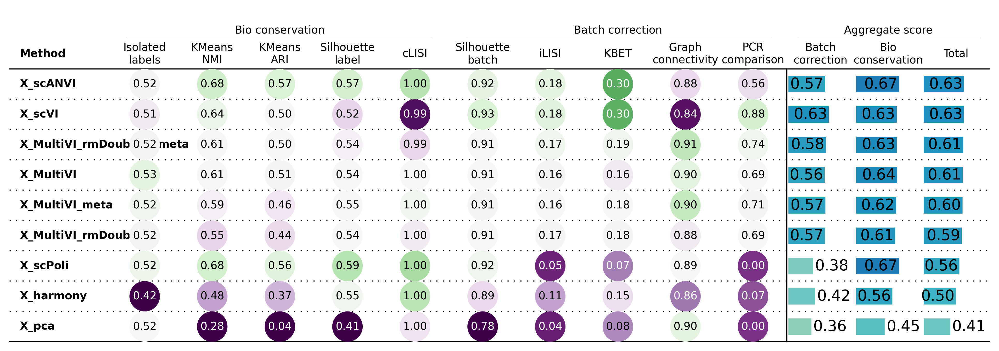

In [28]:
bm.plot_results_table(min_max_scale=False)

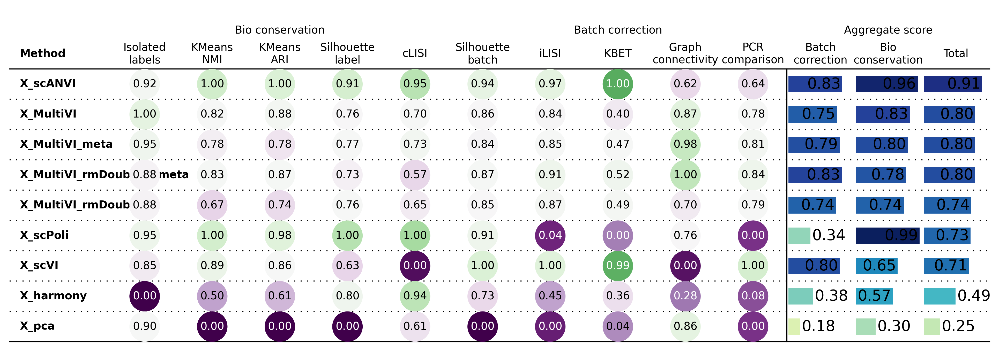

In [29]:
bm.plot_results_table(min_max_scale=True)

## save adata

In [24]:
adata.write('/mnt/hdd/data/Healthy/adata_markedDoublets_normalized_initialAnno_rmDoublets_integrated_all.h5ad')